In [4]:
import json
import os
import torchvision
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np

# Import Data

In [5]:
!wget 'https://computing.ece.vt.edu/~aish/vqacp/vqacp_v2_train_annotations.json'
!wget 'https://computing.ece.vt.edu/~aish/vqacp/vqacp_v2_train_questions.json'
!wget 'https://computing.ece.vt.edu/~aish/vqacp/vqacp_v2_test_annotations.json'
!wget 'https://computing.ece.vt.edu/~aish/vqacp/vqacp_v2_test_questions.json'

--2022-12-09 23:37:59--  https://computing.ece.vt.edu/~aish/vqacp/vqacp_v2_train_annotations.json
Resolving computing.ece.vt.edu (computing.ece.vt.edu)... 128.173.88.40
Connecting to computing.ece.vt.edu (computing.ece.vt.edu)|128.173.88.40|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 362022756 (345M) [application/json]
Saving to: ‘vqacp_v2_train_annotations.json.1’

vqacp_v2_train_anno 100%[===================>] 345.25M  33.9MB/s    in 12s     

2022-12-09 23:38:11 (29.8 MB/s) - ‘vqacp_v2_train_annotations.json.1’ saved [362022756/362022756]

--2022-12-09 23:38:12--  https://computing.ece.vt.edu/~aish/vqacp/vqacp_v2_train_questions.json
Resolving computing.ece.vt.edu (computing.ece.vt.edu)... 128.173.88.40
Connecting to computing.ece.vt.edu (computing.ece.vt.edu)|128.173.88.40|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 52830359 (50M) [application/json]
Saving to: ‘vqacp_v2_train_questions.json.1’

vqacp_v2_train_ques 100%[===

In [6]:
import os
images = os.listdir('../input/coco-2014-dataset-for-yolov3/coco2014/images/train2014/') + os.listdir('../input/coco-2014-dataset-for-yolov3/coco2014/images/val2014/') 

In [7]:
import json

f = open('vqacp_v2_train_annotations.json')

train_annots = json.load(f)
print(len(train_annots))
print(train_annots[0])

f.close()

f = open('vqacp_v2_test_annotations.json')
test_annots = json.load(f)
f.close()

438183
{'question_type': 'what does the', 'coco_split': 'train2014', 'multiple_choice_answer': 'lancashire united', 'answers': [{'answer': 'lancashire united', 'answer_confidence': 'yes', 'answer_id': 1}, {'answer': 'lancashire united', 'answer_confidence': 'yes', 'answer_id': 2}, {'answer': 'lancashire united', 'answer_confidence': 'yes', 'answer_id': 3}, {'answer': 'lancashire united', 'answer_confidence': 'yes', 'answer_id': 4}, {'answer': 'lancashire united', 'answer_confidence': 'yes', 'answer_id': 5}, {'answer': 'lancashire united', 'answer_confidence': 'yes', 'answer_id': 6}, {'answer': 'lancashire united', 'answer_confidence': 'yes', 'answer_id': 7}, {'answer': 'lancashire united', 'answer_confidence': 'yes', 'answer_id': 8}, {'answer': 'lancashire united', 'answer_confidence': 'yes', 'answer_id': 9}, {'answer': 'lancashire united', 'answer_confidence': 'yes', 'answer_id': 10}], 'image_id': 27511, 'answer_type': 'other', 'question_id': 27511005}


In [8]:
f = open('vqacp_v2_train_questions.json')

train_questions = json.load(f)
print(len(train_questions))
print(train_questions[0])

f.close()

f = open('vqacp_v2_test_questions.json')
test_questions = json.load(f)
f.close()

438183
{'image_id': 27511, 'coco_split': 'train2014', 'question': 'What does the bus say on the side?', 'question_id': 27511005}


In [9]:
image_id = {}

for im in images:
    image_id[int(im[-16:-4])] = im

train_question_id = {}

for q in train_questions:
    train_question_id[q['question_id']] = q
    
test_question_id = {}

for q in test_questions:
    test_question_id[q['question_id']] = q

In [10]:
train_qs = []
train_images = []
train_answers = []

failed = 0
for a in train_annots:
    try:
        train_images.append(image_id[a["image_id"]])
        train_qs.append(train_question_id[a["question_id"]]["question"])
        train_answers.append(a["multiple_choice_answer"])
    except:
        failed += 1
        
print(failed/len(train_annots))

test_qs = []
test_images = []
test_answers = []

failed = 0
for a in test_annots:
    try:
        test_images.append(image_id[a["image_id"]])
        test_qs.append(test_question_id[a["question_id"]]["question"])
        test_answers.append(a["multiple_choice_answer"])
    except:
        failed += 1
        
print(failed/len(test_annots))

0.0003514513342598868
0.00034556764031864974


Question:  What does the bus say on the side?
Answer:  lancashire united


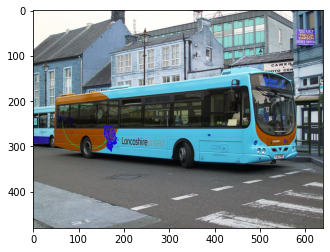

Question:  Is the player on the baseline or service line?
Answer:  service line


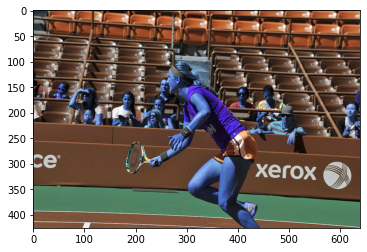

Question:  What words are written on the bus?
Answer:  black diamond


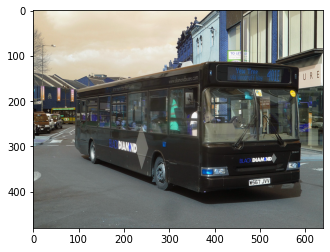

Question:  What kind of store is the bus parked in front of?
Answer:  video store


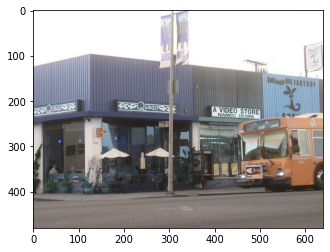

Question:  What are these people in?
Answer:  living room


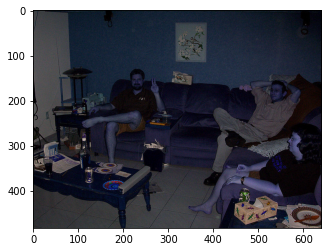

Question:  What does the logo say?
Answer:  united states postal service


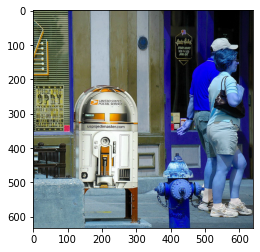

Question:  What is the number on the plane?
Answer:  7


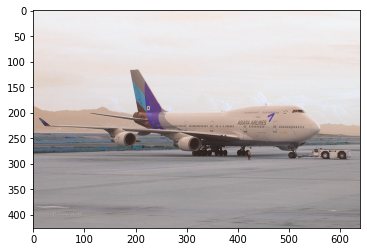

Question:  What is the player's uniform number?
Answer:  7


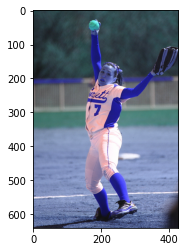

Question:  What is the number of the man in white?
Answer:  7


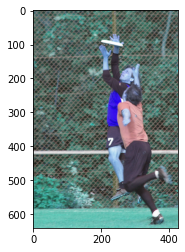

Question:  What is the batter's number on his shirt?
Answer:  7


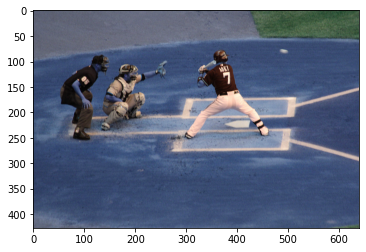

In [11]:
import cv2
import matplotlib.pyplot as plt

for i in range(5):
    print("Question: ", train_qs[i])
    im = cv2.imread('../input/coco-2014-dataset-for-yolov3/coco2014/images/train2014/'+train_images[i])
    try:
        if im == None:
            im = cv2.imread('../input/coco-2014-dataset-for-yolov3/coco2014/images/val2014/'+train_images[i])
    except:
        pass
    plt.imshow(im)
    
    print("Answer: ", train_answers[i])
    plt.show()
    
for i in range(5):
    print("Question: ", test_qs[i])
    im = cv2.imread('../input/coco-2014-dataset-for-yolov3/coco2014/images/train2014/'+test_images[i])
    try:
        if im == None:
            im = cv2.imread('../input/coco-2014-dataset-for-yolov3/coco2014/images/val2014/'+test_images[i])
    except:
        pass
    plt.imshow(im)
    
    print("Answer: ", test_answers[i])
    plt.show()

# Language Model

In [12]:
import torch
import torch.nn as nn
import torch.optim as optim
import math
import torchtext
import datasets
from tqdm import tqdm

In [13]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(0)

In [14]:
dataset = datasets.load_dataset('wikitext', 'wikitext-2-raw-v1')
print(dataset)
print(dataset['train'][88]['text'])

Generating test split:   0%|          | 0/4358 [00:00<?, ? examples/s]

Generating train split:   0%|          | 0/36718 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/3760 [00:00<?, ? examples/s]

Dataset wikitext downloaded and prepared to /root/.cache/huggingface/datasets/wikitext/wikitext-2-raw-v1/1.0.0/a241db52902eaf2c6aa732210bead40c090019a499ceb13bcbfa3f8ab646a126. Subsequent calls will reuse this data.


  0%|          | 0/3 [00:00<?, ?it/s]

DatasetDict({
    test: Dataset({
        features: ['text'],
        num_rows: 4358
    })
    train: Dataset({
        features: ['text'],
        num_rows: 36718
    })
    validation: Dataset({
        features: ['text'],
        num_rows: 3760
    })
})
 This ammunition , and that which I brought with me , was rapidly prepared for use at the Laboratory established at the Little Rock Arsenal for that purpose . As illustrating as the pitiful scarcity of material in the country , the fact may be stated that it was found necessary to use public documents of the State Library for cartridge paper . Gunsmiths were employed or conscripted , tools purchased or impressed , and the repair of the damaged guns I brought with me and about an equal number found at Little Rock commenced at once . But , after inspecting the work and observing the spirit of the men I decided that a garrison 500 strong could hold out against Fitch and that I would lead the remainder - about 1500 - to Gen 'l Rust as 

In [15]:
tokenizer = torchtext.data.utils.get_tokenizer('basic_english')
tokenize_data = lambda example, tokenizer: {'tokens': tokenizer(example['text'])}  
tokenized_dataset = dataset.map(tokenize_data, remove_columns=['text'], 
fn_kwargs={'tokenizer': tokenizer})
print(tokenized_dataset['train'][88]['tokens'])

  0%|          | 0/4358 [00:00<?, ?ex/s]

  0%|          | 0/36718 [00:00<?, ?ex/s]

  0%|          | 0/3760 [00:00<?, ?ex/s]

['this', 'ammunition', ',', 'and', 'that', 'which', 'i', 'brought', 'with', 'me', ',', 'was', 'rapidly', 'prepared', 'for', 'use', 'at', 'the', 'laboratory', 'established', 'at', 'the', 'little', 'rock', 'arsenal', 'for', 'that', 'purpose', '.', 'as', 'illustrating', 'as', 'the', 'pitiful', 'scarcity', 'of', 'material', 'in', 'the', 'country', ',', 'the', 'fact', 'may', 'be', 'stated', 'that', 'it', 'was', 'found', 'necessary', 'to', 'use', 'public', 'documents', 'of', 'the', 'state', 'library', 'for', 'cartridge', 'paper', '.', 'gunsmiths', 'were', 'employed', 'or', 'conscripted', ',', 'tools', 'purchased', 'or', 'impressed', ',', 'and', 'the', 'repair', 'of', 'the', 'damaged', 'guns', 'i', 'brought', 'with', 'me', 'and', 'about', 'an', 'equal', 'number', 'found', 'at', 'little', 'rock', 'commenced', 'at', 'once', '.', 'but', ',', 'after', 'inspecting', 'the', 'work', 'and', 'observing', 'the', 'spirit', 'of', 'the', 'men', 'i', 'decided', 'that', 'a', 'garrison', '500', 'strong', 'co

In [16]:
vocab = torchtext.vocab.build_vocab_from_iterator(tokenized_dataset['train']['tokens'], 
min_freq=3) 
vocab.insert_token('<unk>', 0)           
vocab.insert_token('<eos>', 1)            
vocab.set_default_index(vocab['<unk>'])   
print(len(vocab))                         
print(vocab.get_itos()[:10])  

29473
['<unk>', '<eos>', 'the', ',', '.', 'of', 'and', 'in', 'to', 'a']


In [17]:
def get_data(dataset, vocab, batch_size):
    data = []                                                   
    for example in dataset:
        if example['tokens']:                                      
            tokens = example['tokens'].append('<eos>')             
            tokens = [vocab[token] for token in example['tokens']] 
            data.extend(tokens)                                    
    data = torch.LongTensor(data)                                 
    num_batches = data.shape[0] // batch_size 
    data = data[:num_batches * batch_size]                       
    data = data.view(batch_size, num_batches)          
    return data

In [18]:
class LanguageModel(nn.Module):
    def __init__(self):  
        super(LanguageModel, self).__init__()
        self.embedding = nn.Embedding(len(vocab), 1024)
        self.lstm = nn.LSTM(1024, 1024, num_layers=3, dropout=0.65, batch_first=True)
        self.dropout = nn.Dropout(0.65)
        self.fc = nn.Linear(1024, len(vocab))
    
    def forward(self, x, hidden):
        embedding = self.dropout(self.embedding(x))
        x, hidden = self.lstm(embedding, hidden)          
        x = self.dropout(x) 
        x = self.fc(x)
        return x, hidden
    
def init_weights(model):
    init_range_emb = 0.1
    init_range_other = 1/math.sqrt(1024)
    model.embedding.weight.data.uniform_(-init_range_emb, init_range_emb)
    model.fc.weight.data.uniform_(-init_range_other, init_range_other)
    model.fc.bias.data.zero_()
    for i in range(3):
        model.lstm.all_weights[i][0] = torch.FloatTensor(1024,
                1024).uniform_(-init_range_other, init_range_other) 
        model.lstm.all_weights[i][1] = torch.FloatTensor(1024, 
                1024).uniform_(-init_range_other, init_range_other)
        
def init_hidden(model, batch_size, device):
    hidden = torch.zeros(3, batch_size, 1024).to(device)
    cell = torch.zeros(3, batch_size, 1024).to(device)
    return hidden, cell

def detach_hidden(model, hidden):
    hidden, cell = hidden
    hidden = hidden.detach()
    cell = cell.detach()
    return hidden, cell

In [19]:
def get_batch(data, seq_len, num_batches, idx):
    src = data[:, idx:idx+seq_len]                   
    target = data[:, idx+1:idx+seq_len+1]             
    return src, target

In [20]:
batch_size = 128
train_data = get_data(tokenized_dataset['train'], vocab, batch_size)
valid_data = get_data(tokenized_dataset['validation'], vocab, batch_size)

In [21]:
model = LanguageModel().to(device)
init_weights(model)
model.embedding.weight = model.fc.weight
optimizer = optim.Adam(model.parameters(), lr=1e-3)
criterion = nn.CrossEntropyLoss()

In [22]:
n_epochs = 50
seq_len = 50
lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.5, patience=0)
batch_size = 128

train_loss = 0.0
valid_loss = 0.0
train_losses = []
valid_losses = []
best_valid_loss = 1e10

for e in range(n_epochs):
    epoch_loss = 0
    model.train()
    hidden = init_hidden(model, batch_size, device)
    num_batches = train_data.shape[-1]
    train_data = train_data[:, :num_batches - (num_batches -1) % seq_len]
    num_batches = train_data.shape[-1]

    train_data = train_data.to(device)
    for idx in tqdm(range(0, num_batches - 1, seq_len), desc='Training: ',leave=False):
        optimizer.zero_grad()
        hidden = detach_hidden(model, hidden)

        input_, target = get_batch(train_data, seq_len, num_batches, idx)
        batch_size = input_.shape[0]
        out, hidden = model(input_, hidden)

        out = out.reshape(batch_size * seq_len, -1)
        target = target.reshape(-1)
        loss = criterion(out, target)

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 0.25)
        optimizer.step()
        epoch_loss += loss.item() * seq_len

    train_loss = epoch_loss / num_batches
    train_losses.append(train_loss)

    epoch_loss = 0
    model.eval()
    num_batches = valid_data.shape[-1]
    valid_data = valid_data[:, :num_batches - (num_batches -1) % seq_len]
    num_batches = valid_data.shape[-1]
    valid_data = valid_data.to(device)

    hidden = init_hidden(model, batch_size, device)

    with torch.no_grad():
        for idx in range(0, num_batches - 1, seq_len):
            hidden = detach_hidden(model, hidden)
            input_, target = get_batch(valid_data, seq_len, num_batches, idx)
            input_, target = input_.to(device), target.to(device)
            batch_size= input_.shape[0]

            prediction, hidden = model(input_, hidden)
            prediction = prediction.reshape(batch_size * seq_len, -1)
            target = target.reshape(-1)

            loss = criterion(prediction, target)
            epoch_loss += loss.item() * seq_len

    valid_loss = epoch_loss / num_batches
    valid_losses.append(valid_loss)

    lr_scheduler.step(valid_loss)

    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'language_model.pt')

    print(f'\tTrain Perplexity: {math.exp(train_loss):.3f}')
    print(f'\tValid Perplexity: {math.exp(valid_loss):.3f}')

	Train Perplexity: 1254.634
	Valid Perplexity: 2120.253


	Train Perplexity: 1037.366
	Valid Perplexity: 654.288


	Train Perplexity: 807.458
	Valid Perplexity: 547.475


	Train Perplexity: 675.532
	Valid Perplexity: 454.589


	Train Perplexity: 572.365
	Valid Perplexity: 386.351


	Train Perplexity: 472.923
	Valid Perplexity: 338.328


	Train Perplexity: 375.762
	Valid Perplexity: 271.828


	Train Perplexity: 303.839
	Valid Perplexity: 232.486


	Train Perplexity: 256.269
	Valid Perplexity: 207.674


	Train Perplexity: 225.739
	Valid Perplexity: 190.541


	Train Perplexity: 201.701
	Valid Perplexity: 178.560


	Train Perplexity: 182.619
	Valid Perplexity: 172.734


	Train Perplexity: 167.587
	Valid Perplexity: 163.563


	Train Perplexity: 155.419
	Valid Perplexity: 154.874


	Train Perplexity: 144.286
	Valid Perplexity: 151.041


	Train Perplexity: 135.140
	Valid Perplexity: 145.204


	Train Perplexity: 127.919
	Valid Perplexity: 144.472


	Train Perplexity: 122.062
	Valid Perplexity: 142.052


	Train Perplexity: 116.563
	Valid Perplexity: 137.981


	Train Perplexity: 111.107
	Valid Perplexity: 135.722


	Train Perplexity: 106.494
	Valid Perplexity: 132.449


	Train Perplexity: 102.387
	Valid Perplexity: 130.475


	Train Perplexity: 99.031
	Valid Perplexity: 128.485


	Train Perplexity: 95.405
	Valid Perplexity: 126.991


	Train Perplexity: 92.438
	Valid Perplexity: 126.252


	Train Perplexity: 89.672
	Valid Perplexity: 129.330


	Train Perplexity: 85.415
	Valid Perplexity: 125.780


	Train Perplexity: 83.320
	Valid Perplexity: 126.321


	Train Perplexity: 81.459
	Valid Perplexity: 124.264


	Train Perplexity: 80.236
	Valid Perplexity: 123.948


	Train Perplexity: 79.238
	Valid Perplexity: 123.631


	Train Perplexity: 78.323
	Valid Perplexity: 123.260


	Train Perplexity: 77.392
	Valid Perplexity: 123.560


	Train Perplexity: 77.064
	Valid Perplexity: 120.139


	Train Perplexity: 76.305
	Valid Perplexity: 119.795


	Train Perplexity: 75.860
	Valid Perplexity: 119.549


	Train Perplexity: 75.352
	Valid Perplexity: 120.442


	Train Perplexity: 75.714
	Valid Perplexity: 119.745


	Train Perplexity: 77.574
	Valid Perplexity: 118.054


	Train Perplexity: 76.881
	Valid Perplexity: 117.818


	Train Perplexity: 76.695
	Valid Perplexity: 117.795


	Train Perplexity: 78.700
	Valid Perplexity: 118.033


	Train Perplexity: 79.578
	Valid Perplexity: 117.859


	Train Perplexity: 80.800
	Valid Perplexity: 117.615


	Train Perplexity: 80.618
	Valid Perplexity: 117.599


	Train Perplexity: 80.873
	Valid Perplexity: 117.534


	Train Perplexity: 81.038
	Valid Perplexity: 117.466


	Train Perplexity: 80.564
	Valid Perplexity: 117.467


	Train Perplexity: 81.049
	Valid Perplexity: 117.446


	Train Perplexity: 81.164
	Valid Perplexity: 117.412


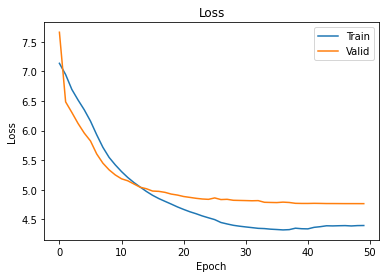

In [23]:
import matplotlib.pyplot as plt

plt.plot(train_losses, label="Train")
plt.plot(valid_losses, label="Valid")
plt.legend()
plt.title("Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show()

In [24]:
def generate(prompt, max_seq_len, temperature, model, tokenizer, vocab, device, seed=None):
    if seed is not None:
        torch.manual_seed(seed)
    model.eval()
    tokens = tokenizer(prompt)
    indices = [vocab[t] for t in tokens]
    batch_size = 1
    hidden = init_hidden(model, batch_size, device)
    with torch.no_grad():
        for i in range(max_seq_len):
            src = torch.LongTensor([indices]).to(device)
            prediction, hidden = model(src, hidden)
            probs = torch.softmax(prediction[:, -1] / temperature, dim=-1)  
            prediction = torch.multinomial(probs, num_samples=1).item()    
            
            while prediction == vocab['<unk>']:
                prediction = torch.multinomial(probs, num_samples=1).item()

            if prediction == vocab['<eos>']:
                break

            indices.append(prediction)

    itos = vocab.get_itos()
    tokens = [itos[i] for i in indices]
    return tokens

In [25]:
prompt = 'Think about'
max_seq_len = 30
seed = 0

temperatures = [0.5, 0.7, 0.75, 0.8, 1.0]
for temperature in temperatures:
    generation = generate(prompt, max_seq_len, temperature, model, tokenizer, 
                          vocab, device, seed)
    print(str(temperature)+'\n'+' '.join(generation)+'\n')

0.5
think about his power .

0.7
think about his power .

0.75
think about his power .

0.8
think about his power .

1.0
think about his conduct . in his fourth series it was a advocate of the friend john carter , the tom sample of the holocaust , and a stanza and drawn actress



# Vision Model

In [33]:
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        self.conv1 = nn.Conv2d(3, 16, 3)
        self.norm1 = nn.BatchNorm2d(16)
        
        self.conv2 = nn.Conv2d(16, 32, 3)
        self.norm2 = nn.BatchNorm2d(32)
        
        self.conv3 = nn.Conv2d(32, 64, 5)
        self.norm3 = nn.BatchNorm2d(64)
        
        self.conv4 = nn.Conv2d(64, 128, 5, stride=2)
        self.norm4 = nn.BatchNorm2d(128)
        
        self.pool = nn.MaxPool2d(3)
        self.dropout = nn.Dropout(.4)
        
        self.fc1 = nn.Linear(1152, 1024)
        
    def forward(self, x):
        x = F.leaky_relu(self.conv1(x))
        x = self.norm1(x)
        x = self.dropout(x)
        #x = self.pool(x)
        x = F.leaky_relu(self.conv2(x))
        x = self.norm2(x)
        x = self.pool(x)
        x = self.dropout(x)
        x = F.leaky_relu(self.conv3(x))
        x = self.norm3(x)
        x = self.pool(x)
        x = self.dropout(x)
        x = F.leaky_relu(self.conv4(x))
        x = self.norm4(x)
        x = self.pool(x)
        x = self.dropout(x)
        
        x = x.flatten(start_dim=1)
        x = F.leaky_relu(self.fc1(x))
        return x
    
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        self.fc = nn.Linear(1024, 100*50*50)
        
        self.dconv1 = nn.ConvTranspose2d(100, 55, 3)
        self.bn1 = nn.BatchNorm2d(55)
        self.dconv2 = nn.ConvTranspose2d(55, 20, 3)
        self.bn2 = nn.BatchNorm2d(20)
        self.dconv3 = nn.ConvTranspose2d(20, 10, 5, stride=2)
        self.bn3 = nn.BatchNorm2d(10)
        self.dconv4 = nn.ConvTranspose2d(10, 3, 4, stride=2)
        self.bn4 = nn.BatchNorm2d(3)
        
    def forward(self, x):
        x = F.leaky_relu(self.fc(x))
        x = x.view(x.size(0), 100, 50, 50)
        
        x = F.leaky_relu(self.dconv1(x))
        x = self.bn1(x)
        x = F.leaky_relu(self.dconv2(x))
        x = self.bn2(x)
        x = F.leaky_relu(self.dconv3(x))
        x = self.bn3(x)
        x = F.leaky_relu(self.dconv4(x))
        x = self.bn4(x)
        
        return x
    
class Autoencoder(nn.Module):
    def __init__(self, encoder, decoder):
        super(Autoencoder, self).__init__()
        
        self.encoder = encoder
        self.decoder = decoder
        
    def forward(self, x):
        x = encoder(x)
        x = decoder(x)
        return x

In [34]:
gc.collect()
torch.cuda.empty_cache()

encoder = Encoder()
decoder = Decoder()
ae = Autoencoder(encoder, decoder)
ae.to(device)
optimizer = optim.Adam(ae.parameters(), lr=1e-3)
crit = MSELoss()

ae(torch.randn(1,3,224,224).to(device)).size()

torch.Size([1, 3, 224, 224])

##### 

 25%|██▍       | 999/4000 [05:38<16:19,  3.06it/s]

Performing Validation.. 
Valid Loss:  0.04896045964211226
Train Loss:  0.3148609594516456


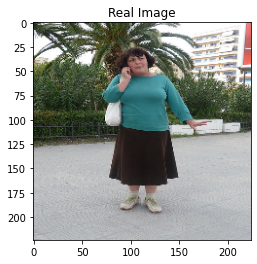

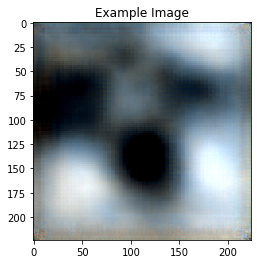

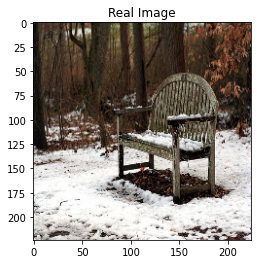

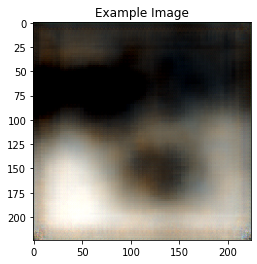

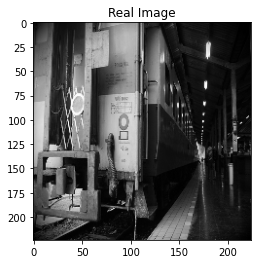

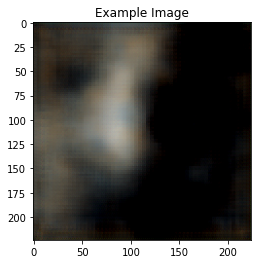

 50%|████▉     | 1999/4000 [13:16<10:50,  3.07it/s]   

Performing Validation.. 
Valid Loss:  0.037226695109158756
Train Loss:  0.03889681257680058


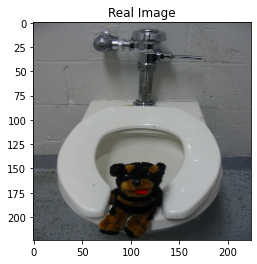

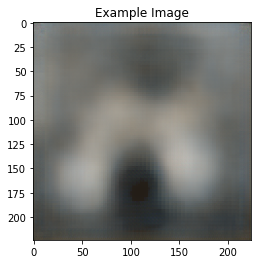

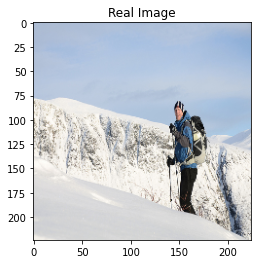

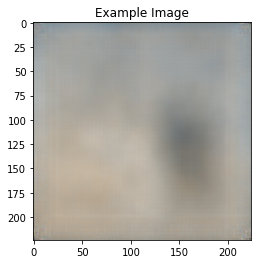

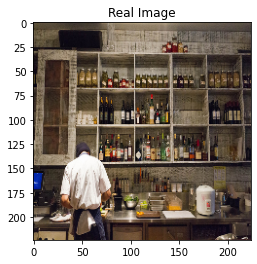

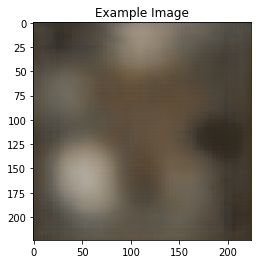

 75%|███████▍  | 2999/4000 [20:28<05:32,  3.01it/s]   

Performing Validation.. 
Valid Loss:  0.03580346043780446
Train Loss:  0.034002459410578015


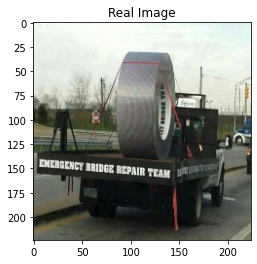

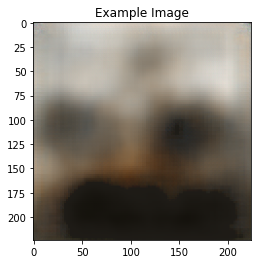

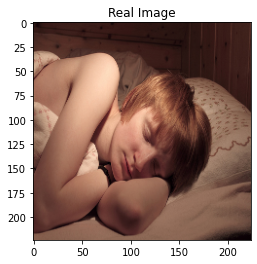

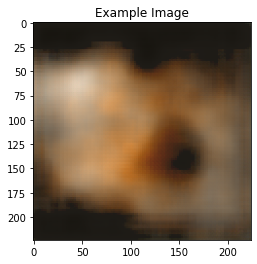

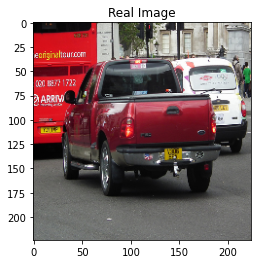

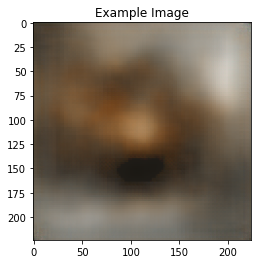

100%|█████████▉| 3999/4000 [27:39<00:00,  3.40it/s]  

Performing Validation.. 
Valid Loss:  0.037988241344690324
Train Loss:  0.03309045040234923


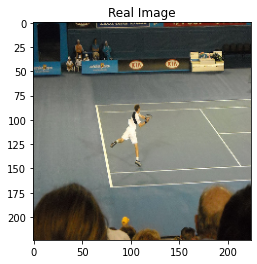

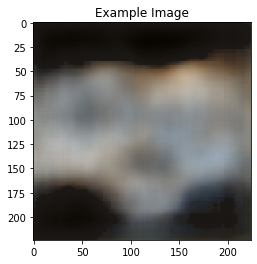

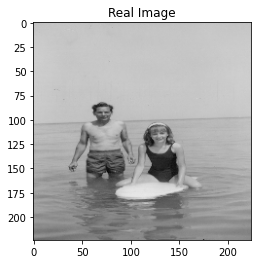

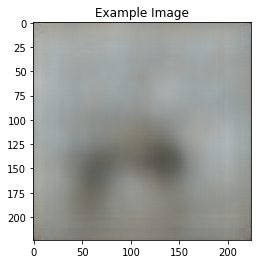

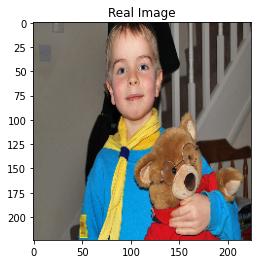

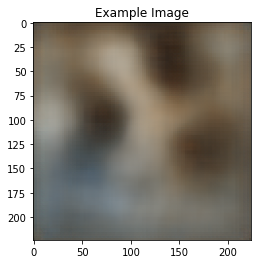

 25%|██▍       | 999/4000 [05:19<15:03,  3.32it/s]

Performing Validation.. 
Valid Loss:  0.03300094098225236
Train Loss:  0.03189523154310882


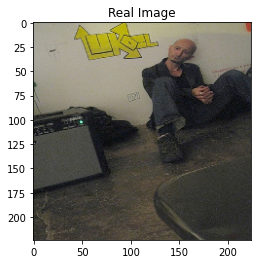

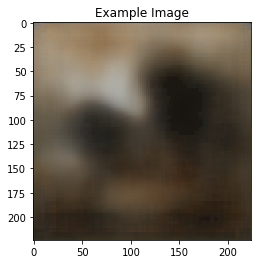

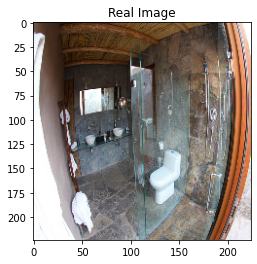

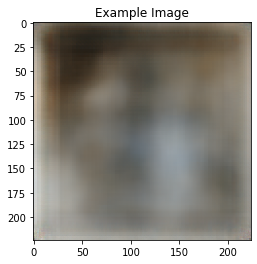

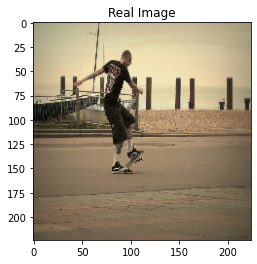

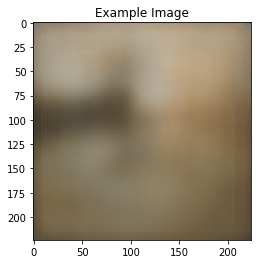

 50%|████▉     | 1999/4000 [12:14<10:08,  3.29it/s]   

Performing Validation.. 
Valid Loss:  0.03257238135486841
Train Loss:  0.031437063969671726


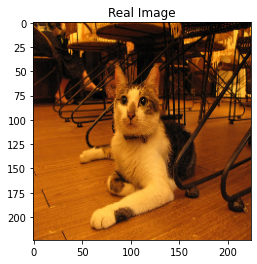

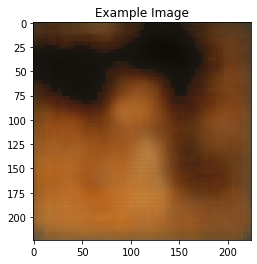

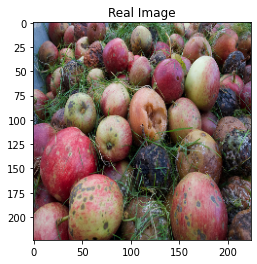

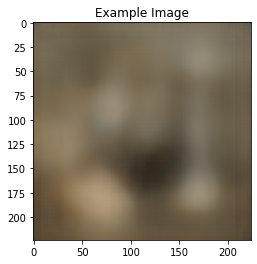

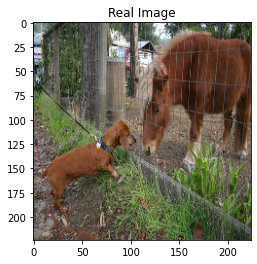

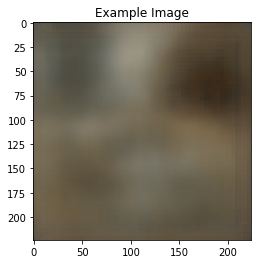

 75%|███████▍  | 2999/4000 [19:07<05:40,  2.94it/s]   

Performing Validation.. 
Valid Loss:  0.03268210427090525
Train Loss:  0.03075411669537425


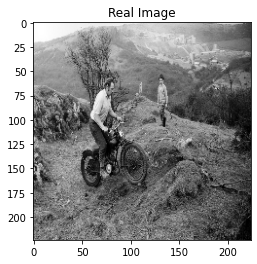

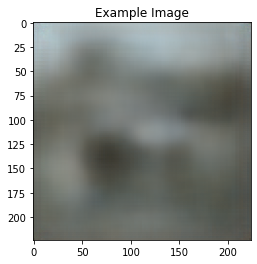

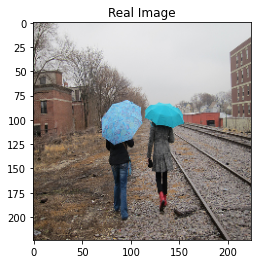

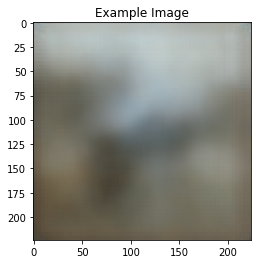

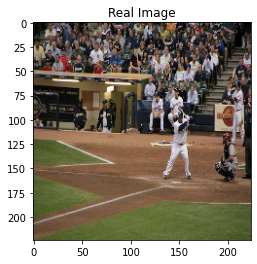

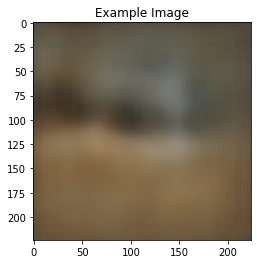

100%|█████████▉| 3999/4000 [26:01<00:00,  3.21it/s]  

Performing Validation.. 
Valid Loss:  0.032372021447867154
Train Loss:  0.030291334772482515


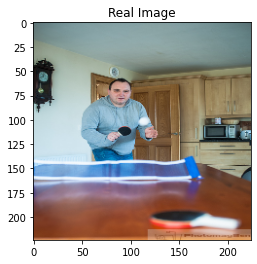

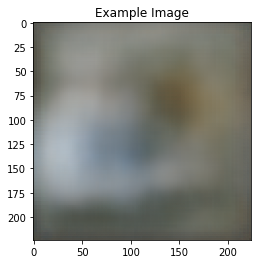

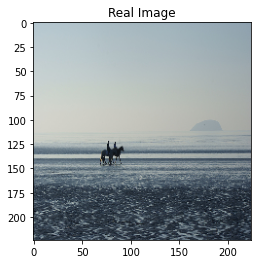

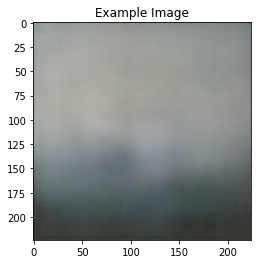

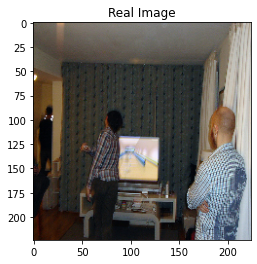

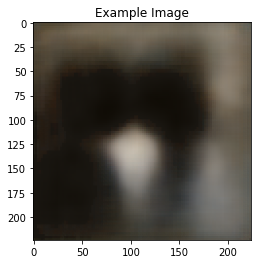

 25%|██▍       | 999/4000 [05:22<15:44,  3.18it/s]

Performing Validation.. 
Valid Loss:  0.03129330672323704
Train Loss:  0.030256083173677326


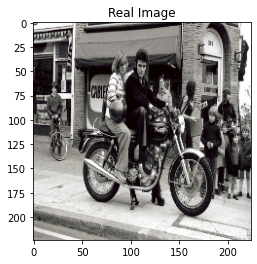

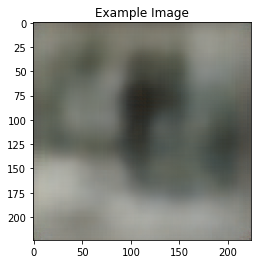

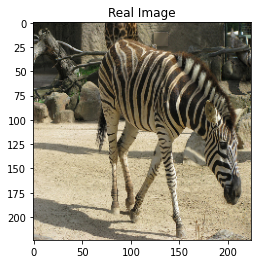

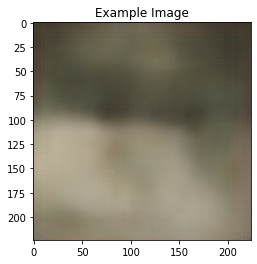

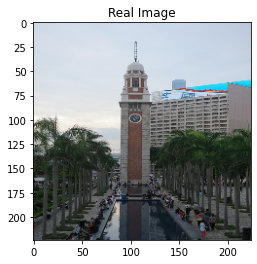

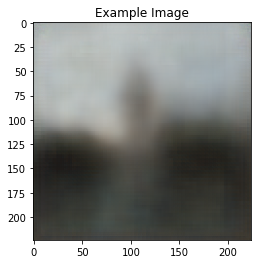

 50%|████▉     | 1999/4000 [12:14<10:34,  3.15it/s]   

Performing Validation.. 
Valid Loss:  0.030118878949433565
Train Loss:  0.030128806129097938


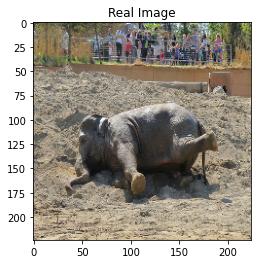

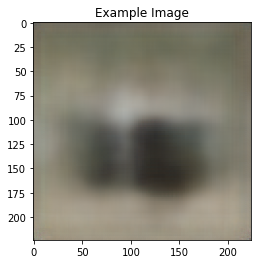

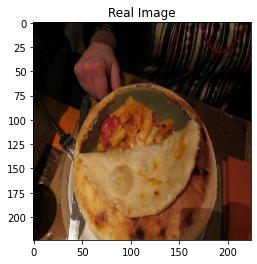

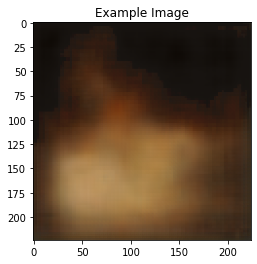

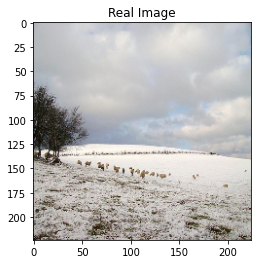

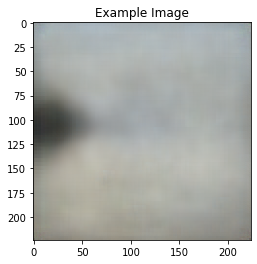

 75%|███████▍  | 2999/4000 [19:15<05:05,  3.28it/s]   

Performing Validation.. 
Valid Loss:  0.030728863637894392
Train Loss:  0.029486626584082843


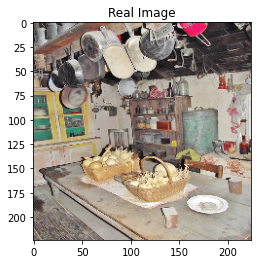

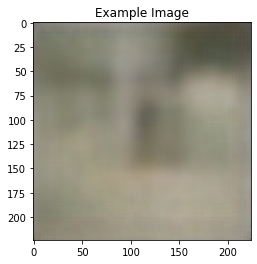

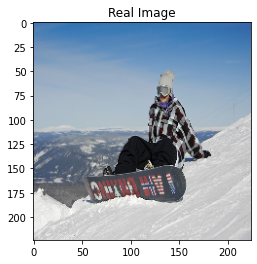

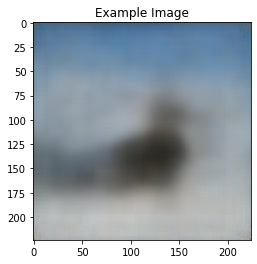

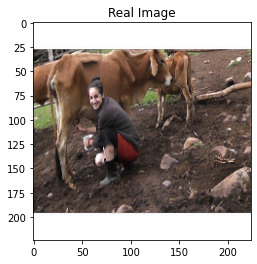

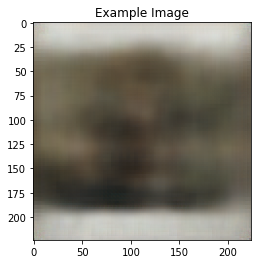

100%|█████████▉| 3999/4000 [26:08<00:00,  3.21it/s]  

Performing Validation.. 
Valid Loss:  0.030209260363131762
Train Loss:  0.02945213219150901


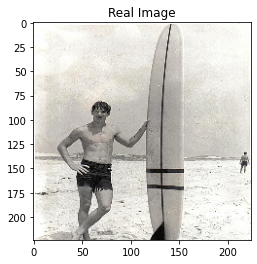

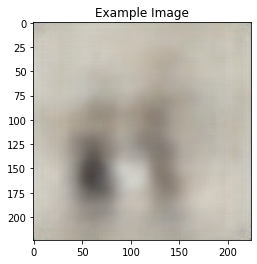

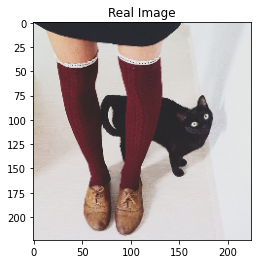

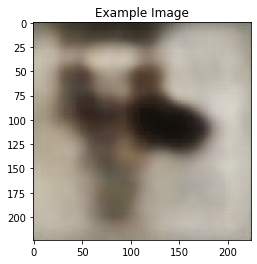

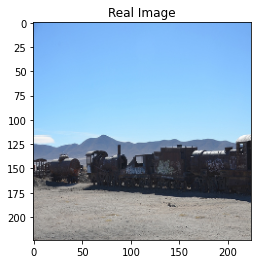

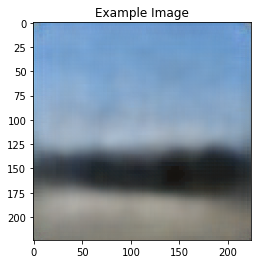

 25%|██▍       | 999/4000 [05:13<15:30,  3.22it/s]

Performing Validation.. 
Valid Loss:  0.030020036198198794
Train Loss:  0.029152926484122873


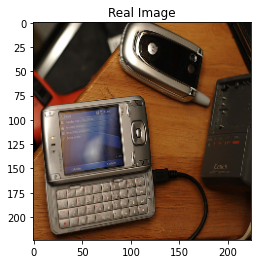

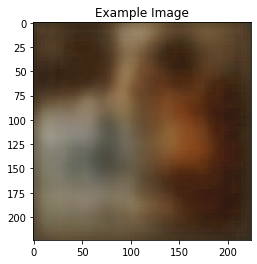

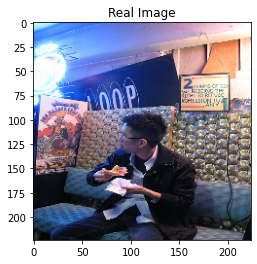

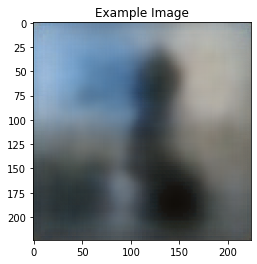

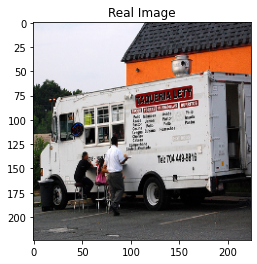

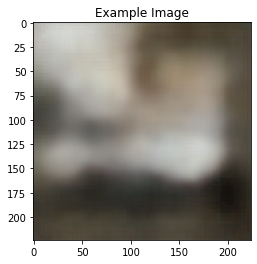

 50%|████▉     | 1999/4000 [12:04<10:20,  3.23it/s]   

Performing Validation.. 
Valid Loss:  0.030510487716645003
Train Loss:  0.029124253226444127


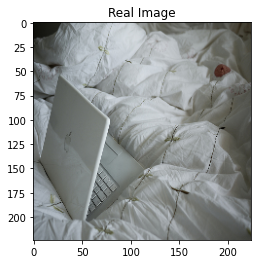

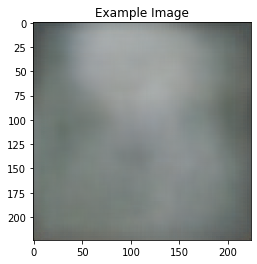

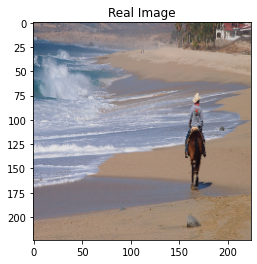

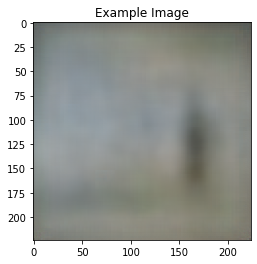

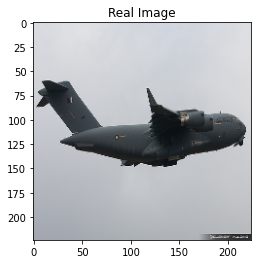

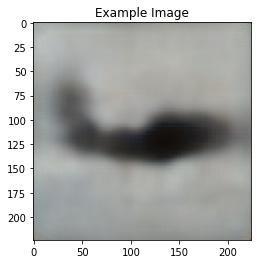

 75%|███████▍  | 2999/4000 [18:54<05:14,  3.18it/s]   

Performing Validation.. 
Valid Loss:  0.0297873330116272
Train Loss:  0.029077489953488113


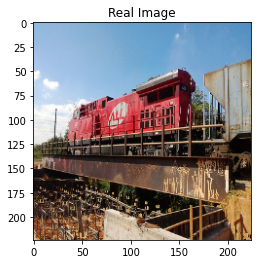

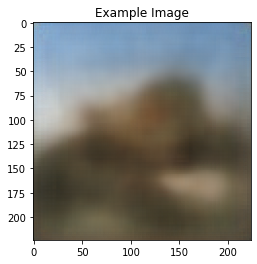

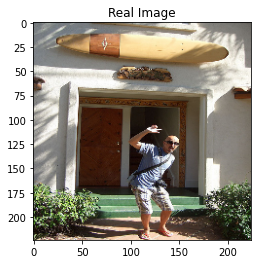

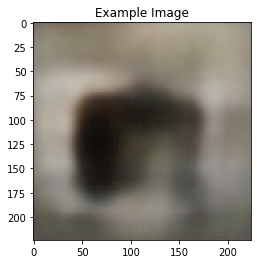

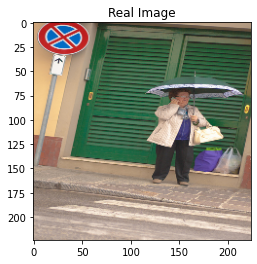

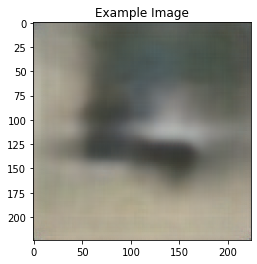

100%|█████████▉| 3999/4000 [25:49<00:00,  3.16it/s]  

Performing Validation.. 
Valid Loss:  0.029475653413683175
Train Loss:  0.02903656717762351


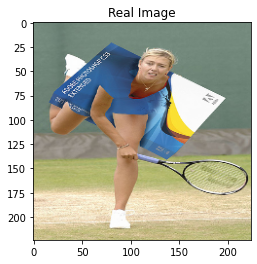

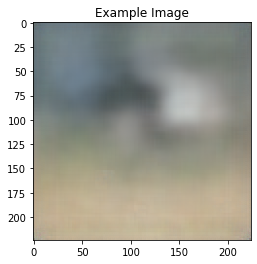

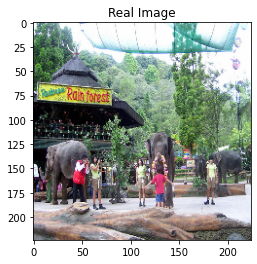

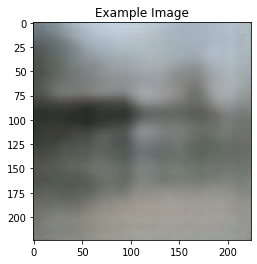

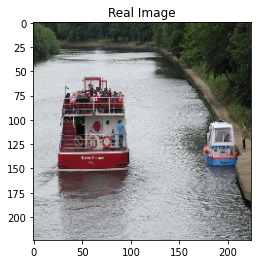

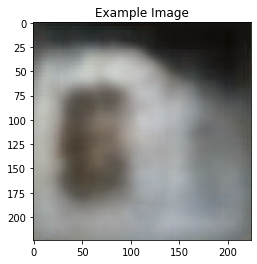

 25%|██▍       | 999/4000 [05:15<16:04,  3.11it/s]

Performing Validation.. 
Valid Loss:  0.02984408425912261
Train Loss:  0.02890859965607524


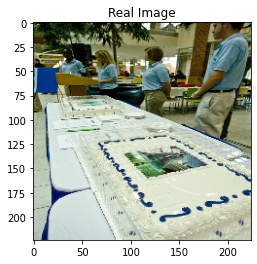

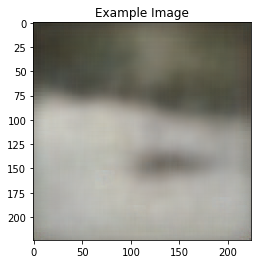

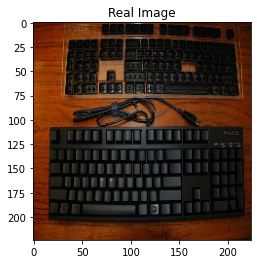

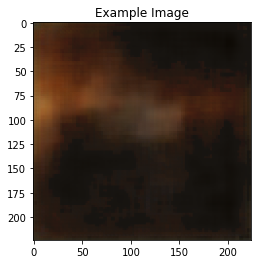

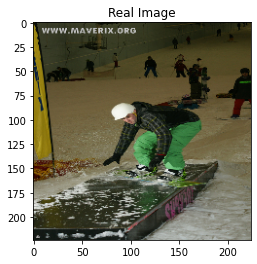

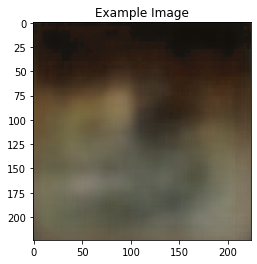

 50%|████▉     | 1999/4000 [12:11<10:49,  3.08it/s]   

Performing Validation.. 
Valid Loss:  0.03054203658923507
Train Loss:  0.029037647522985936


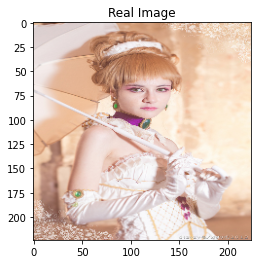

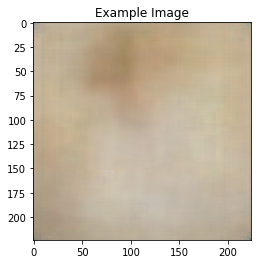

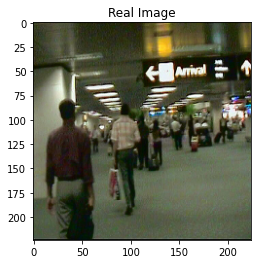

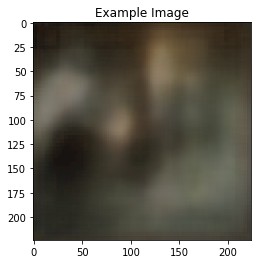

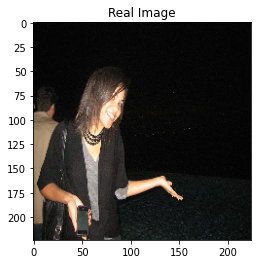

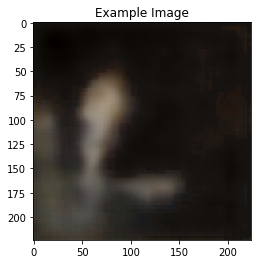

 75%|███████▍  | 2999/4000 [19:09<06:57,  2.40it/s]   

Performing Validation.. 
Valid Loss:  0.02956369548663497
Train Loss:  0.028945217981934546


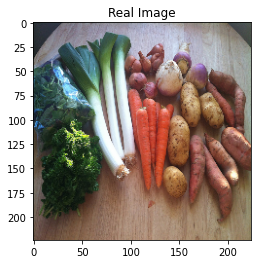

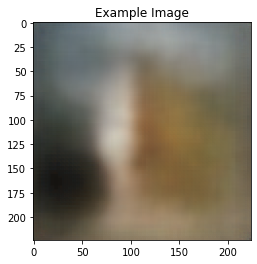

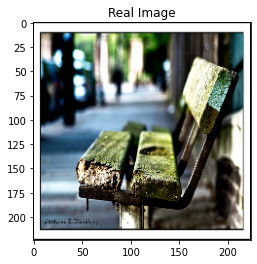

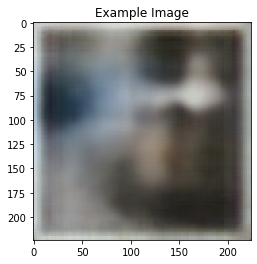

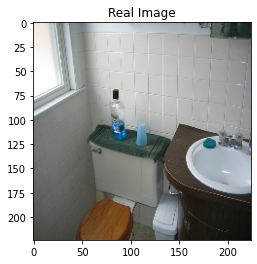

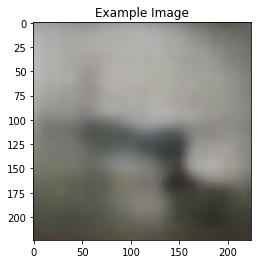

100%|█████████▉| 3999/4000 [26:07<00:00,  2.92it/s]  

Performing Validation.. 
Valid Loss:  0.02954438890144229
Train Loss:  0.02884126524068415


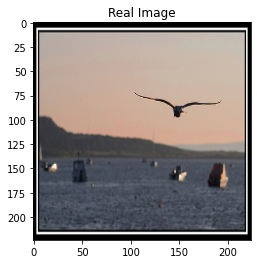

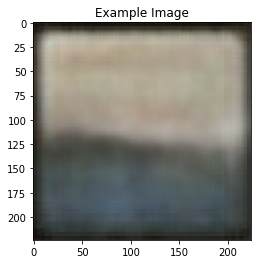

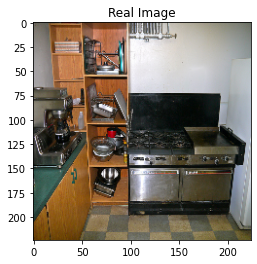

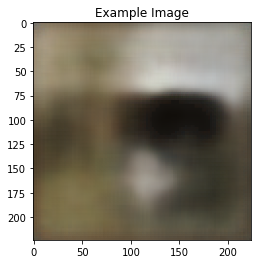

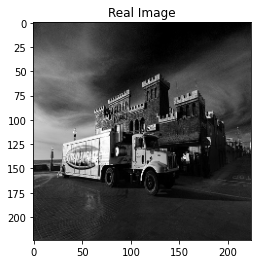

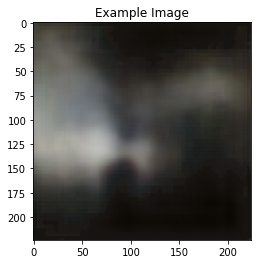

 25%|██▍       | 999/4000 [05:19<15:53,  3.15it/s]

Performing Validation.. 
Valid Loss:  0.02937054618448019
Train Loss:  0.029040346404537558


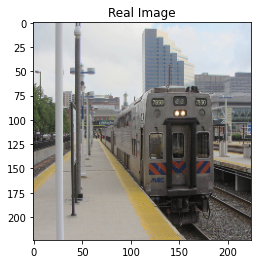

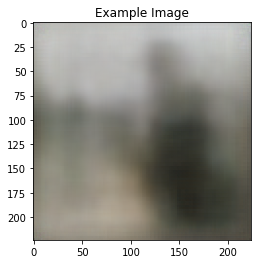

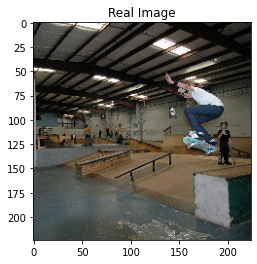

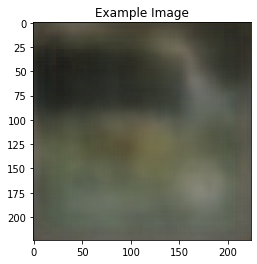

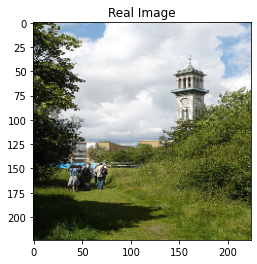

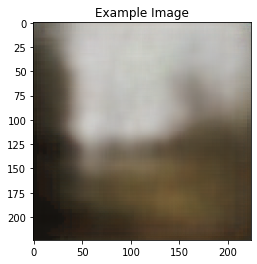

 50%|████▉     | 1999/4000 [12:20<12:17,  2.71it/s]   

Performing Validation.. 
Valid Loss:  0.029974946774542332
Train Loss:  0.02903510038368404


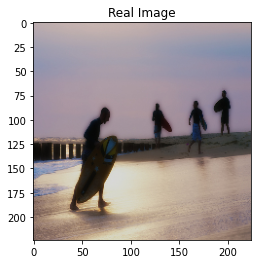

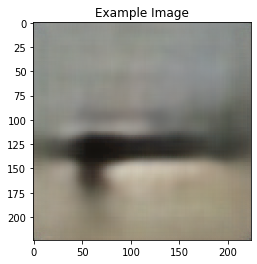

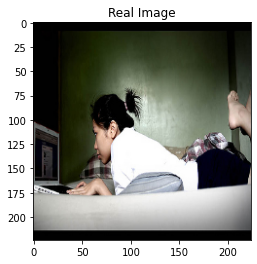

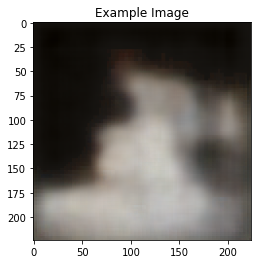

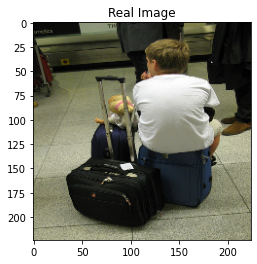

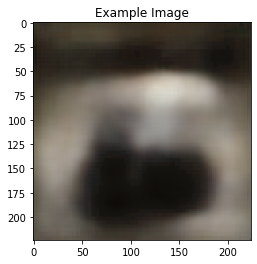

 75%|███████▍  | 2999/4000 [19:18<05:14,  3.18it/s]   

Performing Validation.. 
Valid Loss:  0.02936394302546978
Train Loss:  0.029037706909701227


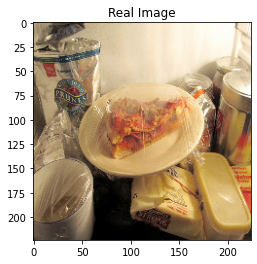

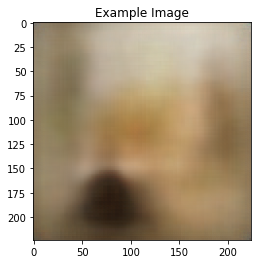

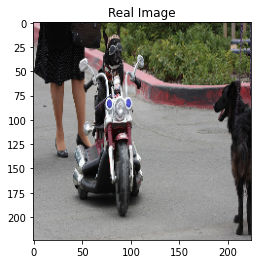

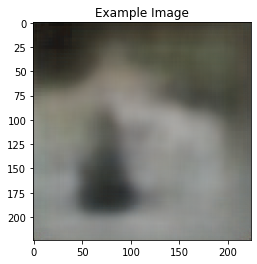

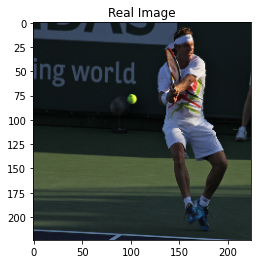

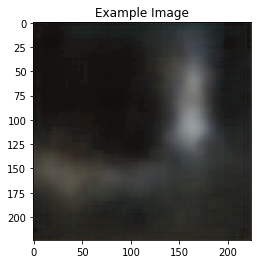

100%|█████████▉| 3999/4000 [26:19<00:00,  3.19it/s]  

Performing Validation.. 
Valid Loss:  0.029607507638633252
Train Loss:  0.02889521823078394


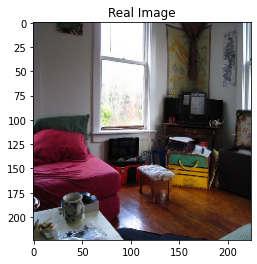

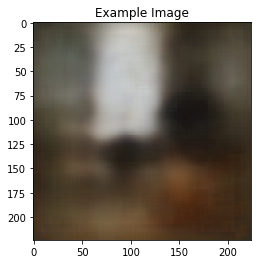

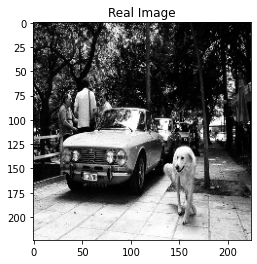

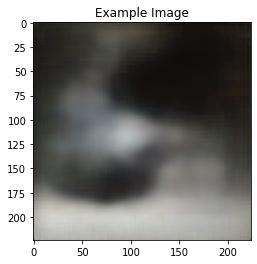

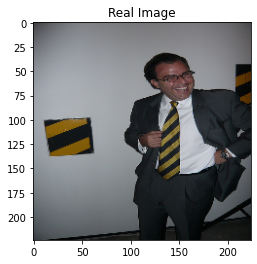

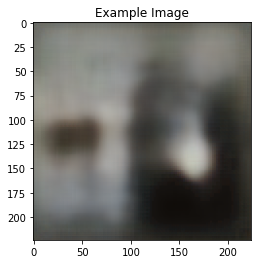

 25%|██▍       | 999/4000 [05:16<15:13,  3.28it/s]

Performing Validation.. 
Valid Loss:  0.029367475010454655
Train Loss:  0.028815798748284577


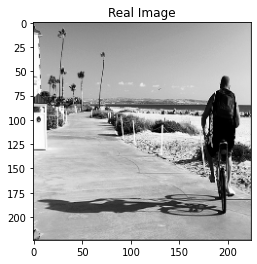

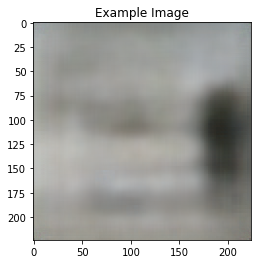

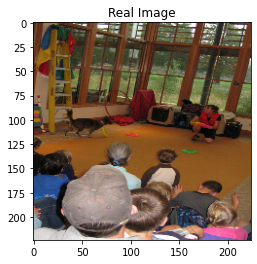

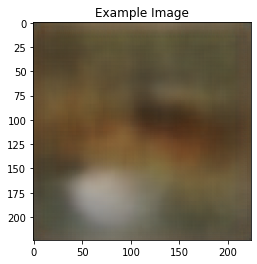

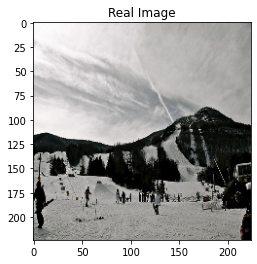

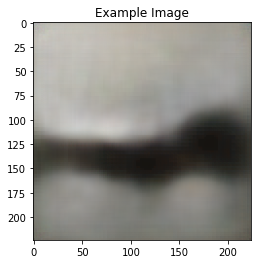

 50%|████▉     | 1999/4000 [12:06<10:04,  3.31it/s]   

Performing Validation.. 
Valid Loss:  0.02984365276619792
Train Loss:  0.02895497666299343


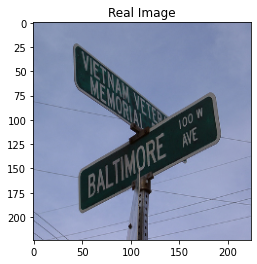

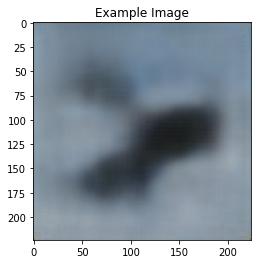

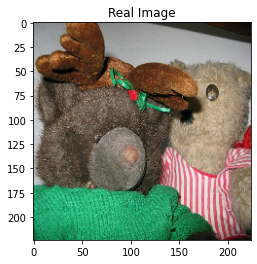

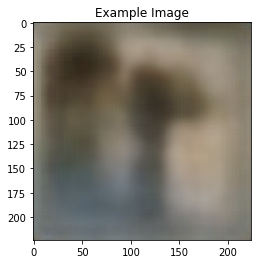

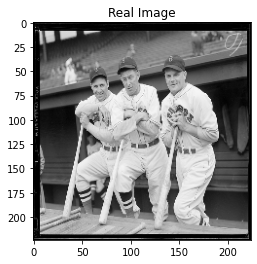

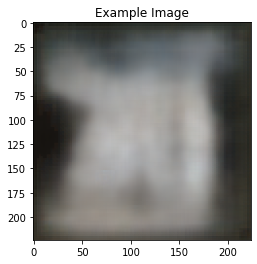

 75%|███████▍  | 2999/4000 [19:01<05:43,  2.91it/s]   

Performing Validation.. 
Valid Loss:  0.02995230470597744
Train Loss:  0.028904440708458424


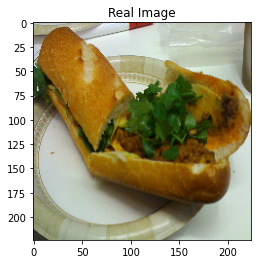

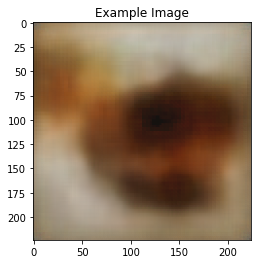

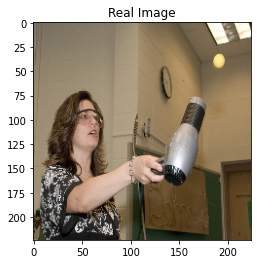

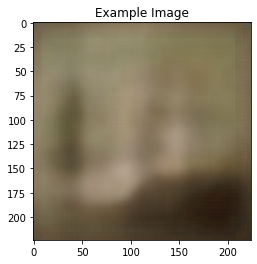

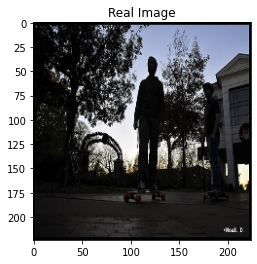

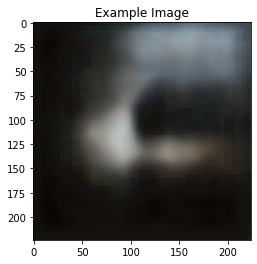

100%|█████████▉| 3999/4000 [26:00<00:00,  3.19it/s]  

Performing Validation.. 
Valid Loss:  0.030395459961146117
Train Loss:  0.02895668506808579


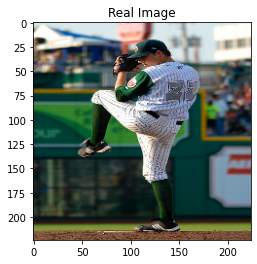

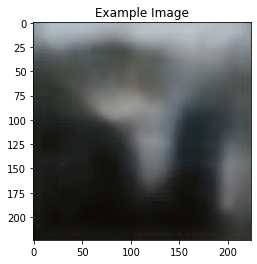

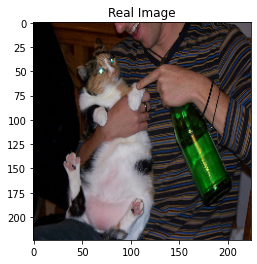

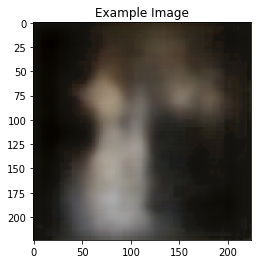

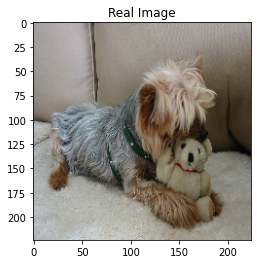

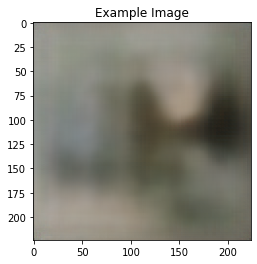

 25%|██▍       | 999/4000 [05:16<14:48,  3.38it/s]

Performing Validation.. 
Valid Loss:  0.02952966395393014
Train Loss:  0.02892913596704602


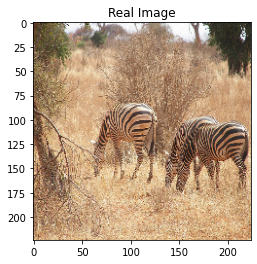

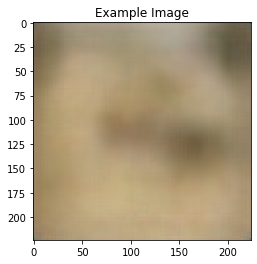

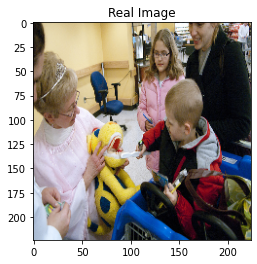

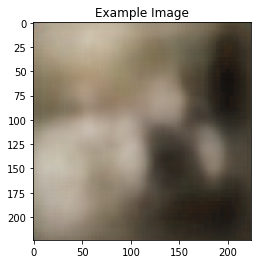

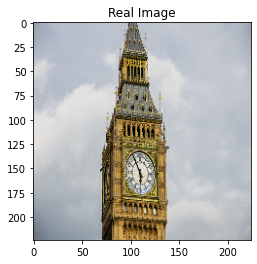

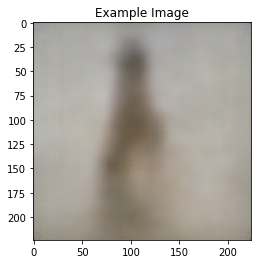

 50%|████▉     | 1999/4000 [12:10<11:11,  2.98it/s]   

Performing Validation.. 
Valid Loss:  0.030061400268226863
Train Loss:  0.028865123940631746


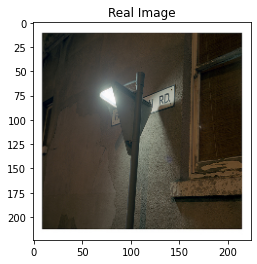

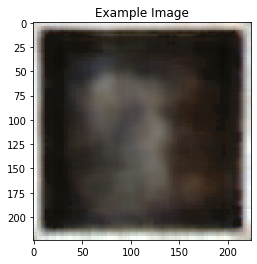

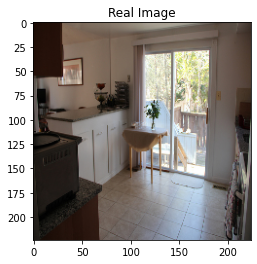

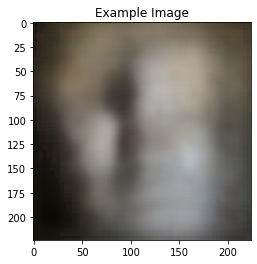

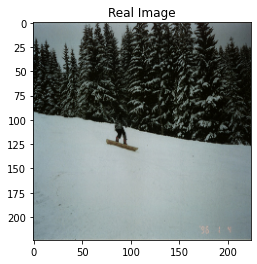

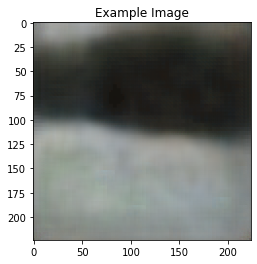

 75%|███████▍  | 2999/4000 [19:04<04:50,  3.45it/s]   

Performing Validation.. 
Valid Loss:  0.02983561583980918
Train Loss:  0.029078005155548453


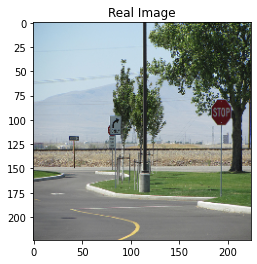

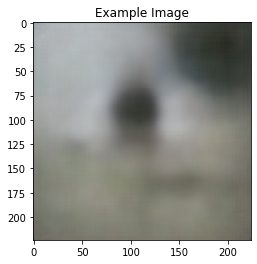

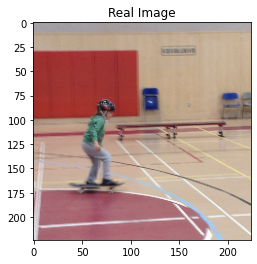

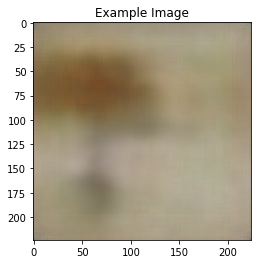

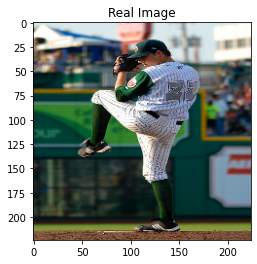

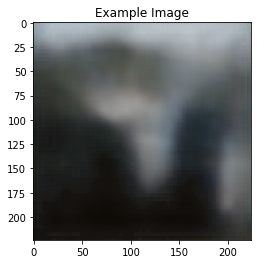

100%|█████████▉| 3999/4000 [26:00<00:00,  3.18it/s]  

Performing Validation.. 
Valid Loss:  0.02966526883095503
Train Loss:  0.029076829655095934


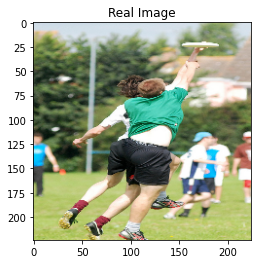

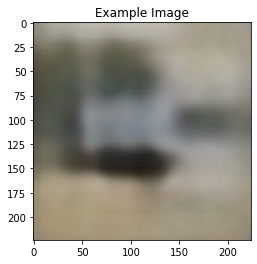

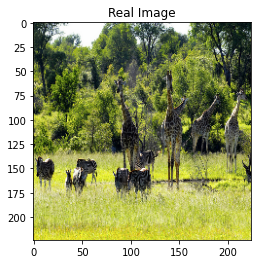

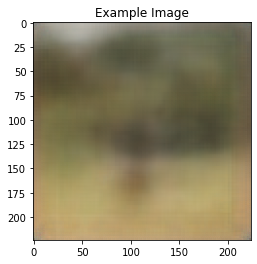

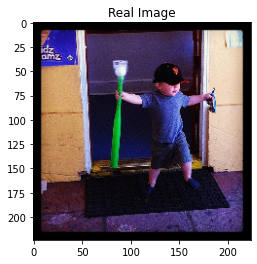

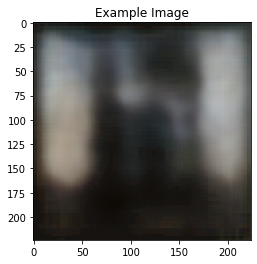

100%|██████████| 4000/4000 [27:39<00:00,  2.41it/s]


In [35]:
from tqdm import tqdm
gc.collect()
torch.cuda.empty_cache()

lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.5, patience=0)

def get_batch(dset, batch_size, center=False):
    batch = []
    for i in range(batch_size):
        if center:
            batch.append(dset[i][0].detach().numpy()[:,int((256/2)-96):int((256/2)+96),int((256/2)-96):int((256/2)+96)])
        else:
            batch.append(dset[i][0].detach().numpy())
    return torch.Tensor(np.array(batch))

num_epochs = 8
batch_size = 16

best_valid_loss = 1e10
valid_losses = []
losses = []
loss_ = 0.0
iter_ = 0

for epoch in range(num_epochs):
    for batch in tqdm(range(0, 4000*batch_size, batch_size)):
        ae.train()
        optimizer.zero_grad()

        real_ims = get_batch(torch.utils.data.Subset(dsets, np.random.choice(4000*batch_size, batch_size, replace=False)), batch_size)
        real_ims = real_ims.to(device)
        
        out = ae(real_ims)
        
        loss = crit(out, real_ims)
        loss.backward()
        optimizer.step()
        
        iter_ += 1
        loss_ += loss.cpu().item()
        if iter_ % 1000 == 0:
            ae.eval()
            
            valid_loss = 0.0
            
            print("Performing Validation.. ")
            with torch.no_grad():
                for v_batch in range(0, 500*batch_size, batch_size):
                    real_ims = get_batch(torch.utils.data.Subset(dsets, np.random.choice(np.arange(4000*batch_size,4000*batch_size+500*batch_size), batch_size, replace=False)), batch_size)
                    real_ims = real_ims.to(device)

                    out = ae(real_ims)
                    loss = crit(out, real_ims)

                    valid_loss += loss.cpu().item()
                
            valid_loss = valid_loss / 500
            if valid_loss < best_valid_loss:
                best_valid_loss = valid_loss
                torch.save(model.state_dict(), 'vision_model_.pt')

            lr_scheduler.step(valid_loss)
                
            valid_losses.append(valid_loss)
            print("Valid Loss: ", valid_loss)
            
            losses.append(loss_/1000)
            print("Train Loss: ", loss_/1000)
            loss_ = 0.0
            
            ex = ae(real_ims[0,:,:,:].view(1,3,224,224))
            
            plt.imshow(real_ims[0,:,:,:].view(3,224,224).permute(1,2,0).cpu().detach().numpy())
            plt.title("Real Image")
            plt.show()
            
            plt.imshow(ex.view(3,224,224).permute(1,2,0).cpu().detach().numpy())
            plt.title("Example Image")
            plt.show()
           
            ex = ae(real_ims[1,:,:,:].view(1,3,224,224))
            
            plt.imshow(real_ims[1,:,:,:].view(3,224,224).permute(1,2,0).cpu().detach().numpy())
            plt.title("Real Image")
            plt.show()
            
            plt.imshow(ex.view(3,224,224).permute(1,2,0).cpu().detach().numpy())
            plt.title("Example Image")
            plt.show()
            
            ex = ae(real_ims[2,:,:,:].view(1,3,224,224))
            
            plt.imshow(real_ims[2,:,:,:].view(3,224,224).permute(1,2,0).cpu().detach().numpy())
            plt.title("Real Image")
            plt.show()
            
            plt.imshow(ex.view(3,224,224).permute(1,2,0).cpu().detach().numpy())
            plt.title("Example Image")
            plt.show()

Text(0.5, 1.0, 'Loss Over Time')

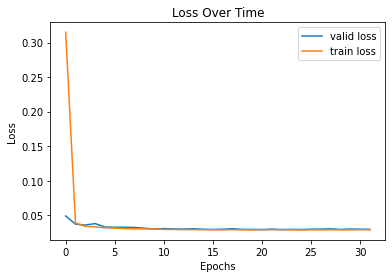

In [36]:
plt.plot(valid_losses, label='valid loss')
plt.plot(losses, label='train loss')
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss Over Time")